In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow import keras
import kerastuner as kt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from astropy import stats
from skimage.transform import resize
from scipy.ndimage import rotate # could use skimage rotate
import sys
import time
from pathlib import Path
from IPython import display
from astropy.io import fits 
from scipy.ndimage import rotate
import glob
from tqdm.notebook import tqdm
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd
import os

In [3]:
def augment1(files, m):
    
    """
    Augmenting for real data images where the ammount of data needs to be scaled up by applying rotations and flips.
    Performs preprocessing including sigma clipping, normalisation and removing nans.
    Upscales by a factor of 2*m
    """
    np.seterr(divide='ignore', invalid='ignore')
    array = np.empty([len(files)*m*2, 128, 128])
    rotation = np.random.uniform(0, 180, m)
    sigma = 1
    pbar = tqdm(total=len(array))
    
    it = 0
    i = 0
    while i < len(files):
        hdulist = fits.open(files[i])
        image = hdulist[0].data.squeeze()

        mean, median, std = stats.sigma_clipped_stats(image, sigma=sigma)
        image[image < median+sigma*std] = median+sigma*std
        image = 2*((image-np.min(image))/np.ptp(image))-1
        image = np.where(np.isnan(image), 0, image)
        mean_n, median_n, std_n = stats.sigma_clipped_stats(image, sigma=sigma)
                    
        j = 0
        while j < m:        
            image_rot1 = rotate(image, rotation[j], reshape=False, cval = median_n)
            image_rot1[image_rot1 > 1] = 1
            image_rot1[image_rot1 < -1] = -1
            image_rot2 = np.fliplr(image_rot1)
            array[it] = image_rot1
            array[it+1] = image_rot2                    
            pbar.update(2)
            it+=2
            j+=1

        i+=1
    
    return array

In [4]:
def gan_augment(files, m):
    
    """
    Augmenting for real data images where the ammount of data needs to be scaled up by applying rotations and flips.
    Performs preprocessing including sigma clipping, normalisation and removing nans.
    Upscales by a factor of 2*m
    """
    np.seterr(divide='ignore', invalid='ignore')
    array = np.empty([len(files)*m*2, 128, 128])
    rotation = np.random.uniform(0, 180, m)
    sigma = 1
    pbar = tqdm(total=len(array))
    
    it = 0
    i = 0
    while i < len(files):
        image = np.squeeze(files[i])

        mean, median, std = stats.sigma_clipped_stats(image, sigma=sigma)
        image[image < median+sigma*std] = median+sigma*std
        image = 2*((image-np.min(image))/np.ptp(image))-1
        image = np.where(np.isnan(image), 0, image)
        mean_n, median_n, std_n = stats.sigma_clipped_stats(image, sigma=sigma)
                    
        j = 0
        while j < m:        
            image_rot1 = rotate(image, rotation[j], reshape=False, cval = median_n)
            image_rot1[image_rot1 > 1] = 1
            image_rot1[image_rot1 < -1] = -1
            image_rot2 = np.fliplr(image_rot1)
            array[it] = image_rot1
            array[it+1] = image_rot2                    
            pbar.update(2)
            it+=2
            j+=1

        i+=1
    
    return array

In [5]:
def dont_rotate(files):
    
    """
    Augmenting for real data images where the ammount of data needs to be scaled up by applying rotations and flips.
    Performs preprocessing including sigma clipping, normalisation and removing nans.
    Upscales by a factor of 2*m
    """

    array = np.empty([len(files)*4, 128, 128])
    sigma = 1
    pbar = tqdm(total=len(array))
    
    it = 0
    i = 0
    while i < len(files):
        hdulist = fits.open(files[i])
        image = hdulist[0].data.squeeze()
        
        mean, median, std = stats.sigma_clipped_stats(image, sigma=sigma)
        image[image < median+sigma*std] = median+sigma*std
        image = 2*((image-np.min(image))/np.ptp(image))-1
        image = np.where(np.isnan(image), 0, image)
                    
        image[image > 1] = 1
        image[image < -1] = -1
        image_rot = np.fliplr(image)
        image_rot2 = np.flipud(image)
        image_rot3 = np.flipud(image_rot)
        array[it] = image
        array[it+1] = image_rot
        array[it+2] = image_rot2
        array[it+3] = image_rot3
        pbar.update(4)
        it+=4
        i+=1
    
    return array

In [6]:
def show_images(images, labels, predictions, num, predict):
    """
    Visualising the images
    """
    images = np.squeeze(images)
    cols = 6
    rows = (num+cols-1)//cols
    plt.figure(figsize=(cols*4, rows*4))
    for i in range(num):
        ax = plt.subplot(rows, cols, i+1)
        image = images[i]
        if predict:
                plt.title('{} // {}'.format(predictions[i], labels[i]))
        else:
            plt.title(labels[i])
        plt.imshow(image, cmap='inferno')
        plt.axis('off')
    plt.show() 

In [7]:
#loading the data

files1 = glob.glob(r'Raw Data\Filaments\cut*')

files2 = []
j = 0
while j < 20000:
    if Path(r"Raw Data\Not Filaments\cut{}.fits".format(j)).is_file():
        files2.append(r"Raw Data\Not Filaments\cut{}.fits".format(j))
    else:
        pass   
    j+=1

files3 = []
j = 0
while j < 20000:
    if Path(r"Raw Data\Also Not Filaments\cut{}.fits".format(j)).is_file():
        if len(fits.open(r"Raw Data\Also Not Filaments\cut{}.fits".format(j))) == 1:
            files3.append(r"Raw Data\Also Not Filaments\cut{}.fits".format(j))
    else:
        pass   
    j+=1
    
files4 = []
j = 0
while j < 20000:
    if Path(r"Raw Data\Dont_rotate\cut{}.fits".format(j)).is_file():
        files4.append(r"Raw Data\Dont_rotate\cut{}.fits".format(j))
           
    j+=1

In [8]:
gan_images = np.load(r"Data arrays/gan_generated_fils.npy")

In [9]:
files2 = files2[700:] #remove repetative images

In [10]:
files2 = files2[::3]  #attempting to get to a closer balance in datasets

In [11]:
print(len(files1))
print(len(files2))
print(len(files3))
print(len(files4))
print(len(gan_images))

394
2769
412
116
1500


In [12]:
#increase training data size when training.

fils = augment1(files1, 34)
n_fils = augment1(files2, 2)
n_fils2 = augment1(files3, 20)
fils2 = dont_rotate(files4)
gan_fils = gan_augment(gan_images,4)

  0%|          | 0/26792 [00:00<?, ?it/s]

  0%|          | 0/11076 [00:00<?, ?it/s]

  0%|          | 0/16480 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

In [13]:
n_fils = np.concatenate((n_fils2, n_fils))
n_fils2 = []
len(n_fils)

27556

In [14]:
fils = np.concatenate((fils, fils2))
fils2 = []
len(fils)

27256

In [18]:
#Creating the testing set of only real augmented data
#Creating the training set a mix of real augmented data, simulated and GAN data 

train_fils, test_fils = train_test_split(fils, test_size=0.3, shuffle=True)
train_nfils, test_nfils = train_test_split(n_fils, test_size=0.3, shuffle=True)

#avoid maxing memory by deleating unused variables
fils = []
n_fils = []

#Creates the test set
test_labels_fils = np.full(len(test_fils), 1)
test_labels_nfils = np.zeros(len(test_nfils))
test_images = np.concatenate((test_fils, test_nfils))
test_labels = np.concatenate((test_labels_fils, test_labels_nfils))
test_fils=[] 
test_nfils=[]
test_labels_fils=[]
test_labels_nfils=[]

In [19]:
print(len(train_fils))
#print(len(gan_fils))
print(len(train_nfils))


19079
19289


In [20]:
# train_fils = train_fils[:len(train_nfils)//2]
# gan_fils = gan_fils[:len(train_nfils)//2]

In [21]:
#Creating training set
train_labels_fils = np.full(len(train_fils), 1)
train_labels_nfils = np.zeros(len(train_nfils))
#labels_GAN = np.full(len(gan_fils), 1)
#labels_SIM = np.full(len(SIM), 1)
train_images = np.concatenate((train_fils, train_nfils))
train_labels = np.concatenate((train_labels_fils, train_labels_nfils))
# train_images = np.concatenate((train_fils, train_nfils, gan_fils))
# train_labels = np.concatenate((train_labels_fils, train_labels_nfils, labels_GAN))
train_fils=[]
train_nfils=[]
train_labels_fils=[]
train_labels_nfils=[]

In [22]:
a = list(zip(test_images, test_labels))
random.shuffle(a)
test_images, test_labels = zip(*a)
b = list(zip(train_images, train_labels))
random.shuffle(b)
train_images, train_labels = zip(*b)

train_images = np.asarray(train_images)
test_images = np.asarray(test_images)
train_labels = np.asarray(train_labels)
test_labels = np.asarray(test_labels)

In [3]:
unique, counts = np.unique(train_labels, return_counts=True)
dict(zip(unique, counts))

{0.0: 19289, 1.0: 19209}

In [4]:
unique, counts = np.unique(test_labels, return_counts=True)
dict(zip(unique, counts))

{0.0: 8267, 1.0: 8233}

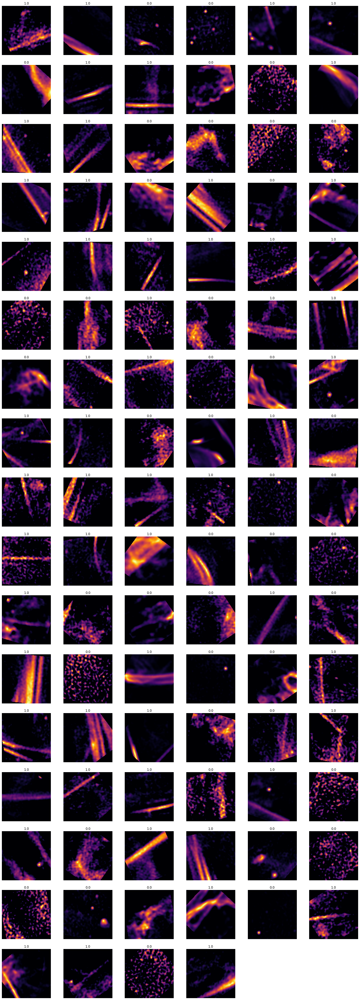

In [25]:
#View data as a last check
show_images(train_images, train_labels,_ ,100, predict=False)

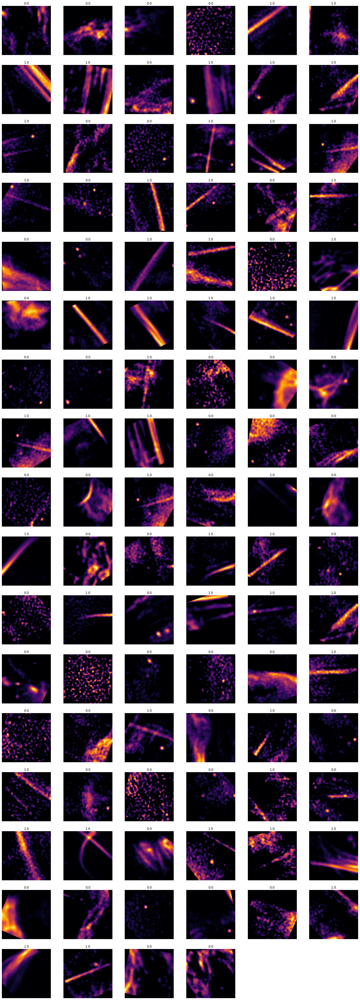

In [26]:
show_images(test_images, test_labels,_ ,100, predict=False)

In [27]:
train_images = train_images[..., tf.newaxis].astype('float32')
test_images = test_images[..., tf.newaxis].astype('float32')

In [28]:
np.save(r"Data arrays\train_images2.npy", train_images)
np.save(r"Data arrays\test_images2.npy", test_images)
np.save(r"Data arrays\train_labels2.npy", train_labels)
np.save(r"Data arrays\test_labels2.npy", test_labels)

In [2]:
train_images = np.load(r"Data arrays\train_images.npy")
test_images = np.load(r"Data arrays\test_images.npy")
train_labels = np.load(r"Data arrays\train_labels.npy")
test_labels = np.load(r"Data arrays\test_labels.npy")

In [79]:
print('train images: ', train_images.shape)
print('test images: ', test_images.shape)

train images:  (38498, 128, 128, 1)
test images:  (16500, 128, 128, 1)


In [80]:
train_ds = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
test_ds = tf.data.Dataset.from_tensor_slices((test_images, test_labels))

In [81]:
batch_size = 32
epochs = 40
input_shape = train_images.shape[1:]

In [82]:
model = models.Sequential([
    layers.Conv2D(16, (3, 3), padding='same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
#     layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
#     layers.MaxPooling2D((2, 2)),
#     layers.Conv2D(512, (3, 3), padding='same', activation='relu'),
#     layers.MaxPooling2D((2, 2)),
#     layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
#     layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')])

model.compile(optimizer="Adam", loss='binary_crossentropy', metrics=['accuracy'])

In [83]:
model = tf.keras.models.load_model(r"saved_models\4_layer_model_tuned")

callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0, patience=10, verbose=0,mode='auto', baseline=None, restore_best_weights=True)
history = model.fit(train_ds.batch(batch_size), validation_data=test_ds.batch(batch_size), epochs=epochs, callbacks=[callback])
model.evaluate(test_ds.batch(batch_size), verbose=1)

Epoch 1/40
1204/1204 [==============================] - 32s 26ms/step - loss: 0.2440 - accuracy: 0.9089 - val_loss: 0.1212 - val_accuracy: 0.9565
Epoch 2/40
1204/1204 [==============================] - 31s 26ms/step - loss: 0.0776 - accuracy: 0.9731 - val_loss: 0.1156 - val_accuracy: 0.9664
Epoch 3/40
1204/1204 [==============================] - 31s 26ms/step - loss: 0.0355 - accuracy: 0.9884 - val_loss: 0.0702 - val_accuracy: 0.9808
Epoch 4/40
1204/1204 [==============================] - 31s 26ms/step - loss: 0.0272 - accuracy: 0.9910 - val_loss: 0.0918 - val_accuracy: 0.9787
Epoch 5/40
1204/1204 [==============================] - 32s 26ms/step - loss: 0.0210 - accuracy: 0.9932 - val_loss: 0.0647 - val_accuracy: 0.9858
Epoch 6/40
1204/1204 [==============================] - 33s 27ms/step - loss: 0.0190 - accuracy: 0.9943 - val_loss: 0.1108 - val_accuracy: 0.9775
Epoch 7/40
1204/1204 [==============================] - 39s 32ms/step - loss: 0.0141 - accuracy: 0.9954 - val_loss: 0.0645 -

[0.11093267798423767, 0.9889090657234192]

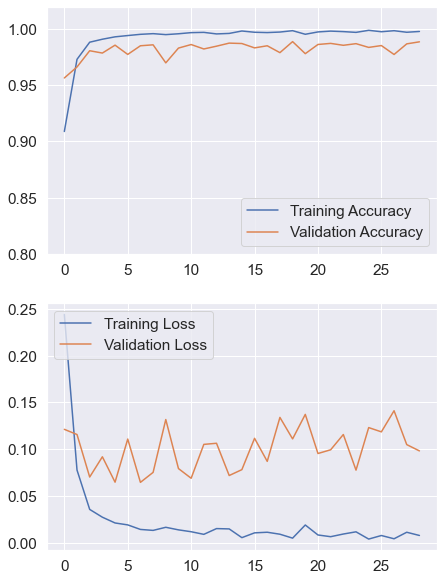

In [92]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))
plt.figure(figsize=(7, 10))
#plt.title("")
plt.subplot(2, 1, 1)
plt.ylim(0.8,1.02)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
#plt.savefig(r'Seminar Images\10.0.png')
#plt.show()

plt.subplot(2, 1, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper left')
#plt.title('Training and Validation Loss')
#plt.savefig(r'Seminar Images\7500_0_2500.png')
plt.show()

In [93]:
test_predictions = model.predict(test_images)
test_predictions = np.squeeze(test_predictions)

In [94]:
a = confusion_matrix(test_labels, test_predictions.round())

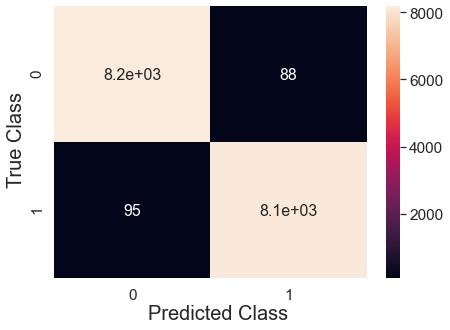

In [95]:
df_cm = pd.DataFrame(a, range(2), range(2))
plt.figure(figsize=(7,5))
#plt.title("0 : 1 : 0")
plt.text(-0.3,1.3,'True Class', fontsize=20, rotation=90)
plt.text(0.6,2.3,'Predicted Class', fontsize=20)
sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size
#plt.savefig(r'Seminar Images\confushion_10.0.png')
plt.show()

In [96]:
diff = abs(test_labels - test_predictions)

In [97]:
order = np.argsort(diff)

In [98]:
sorted_test_images = test_images[order][::-1]
sorted_test_labels = test_labels[order][::-1]
sorted_test_predictions = test_predictions[order][::-1]

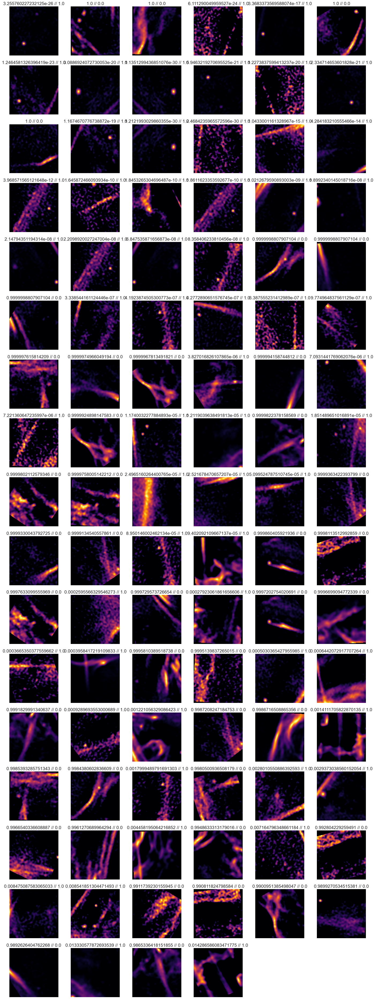

In [99]:
#the images it was least accurate for
show_images(sorted_test_images, sorted_test_labels, sorted_test_predictions, 100, predict=True)

In [100]:
model.save(r'saved_models\4_layer_model_tuned_trained_valacc_41_2_20')

INFO:tensorflow:Assets written to: saved_models\4_layer_model_tuned_trained_valacc_41_2_20\assets
